<a href="https://colab.research.google.com/github/gregrell/CAP6671/blob/main/RuleBased_CombinedArms.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction
This code example uses [PettingZoo](https://www.pettingzoo.ml/#) as a mutli-agent reinforcement learning platform for the [Combinded Arms](https://www.pettingzoo.ml/magent/combined_arms) environment.

This is an example of how to render PettingZoo's GUI in Colab and also serves as a template for testing separate Red and Blue models.

Author: Dr. S. Mondesire

Last Modified: 2022-04-03

# Import Libraries

In [1]:
!apt update && apt install xvfb
!pip install gym-notebook-wrapper
!apt update && apt install python-opengl ffmpeg
!pip install pygame
!pip install pettingzoo[magent]

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Ign:3 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  Release
Hit:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:6 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:7 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:8 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease [15.9 kB]
Get:9 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:10 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Hit:11 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Hit:12 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease
Hit:14 http://ppa

# Model Creation
This model randomly moves, attacks, or does nothing per timestep. Handles both ranged and melee agents.

In [144]:
class MyModel:
  import random as rand
  
  def __enemyMap(self,observation,agent):
            return observations[agent][:,:,6] + observations[agent][:,:,7]
  def __friendMap(self,observation,agent):
            return observations[agent][:,:,1] + observations[agent][:,:,3]
  def __meleeRandMove(self):
            return self.rand.randint(0,4)
  def __rangedRandMove(self):
            return self.rand.randint(0,12)
  def __meleeEnemyInRange(self,obs,agent):
    # Determine if there's an enemy in range for attack for
    # melee agent
            enemies = self.__enemyMap(obs,agent)
            enemy = 0
            if(enemies[6,7]):
              enemy =3
            if(enemies[6,5]):
              enemy =2
            if(enemies[5,6]):
              enemy =1
            if(enemies[7,6]):
              enemy =4    
            return enemy
  def __meleeBestMovement(self,obs,agent):
            enemy_position=self.__meleeEnemyInRange(obs,agent)
            action = 2
            if enemy_position >0:
              if enemy_position == 1:
                action = 5
              elif enemy_position == 2:
                action = 6
              elif enemy_position == 3:
                action = 7
              elif enemy_position == 4:
                action = 8
            else:
              action = self.__meleeRandMove()
            
            return action






  def predict(self, env, observation, agent):
    action = env.action_space(agent).sample()
    if 'mel' in agent: #red ones
      action = 2 # do nothing melee
      action = self.__meleeBestMovement(observation,agent)


      None
    elif 'ranged' in agent: #bule ones
      action = 6 # do nothing ranged
      None
    if 'redmelee_36' in agent:
      #print(self.__enemyMap(observation,agent))
      #print(self.__enemyMap(observation,agent))
      #print(self.__meleeEnemyInRange(observation,agent))
      action = self.__meleeBestMovement(observation,agent)

    if 'blueranged_0' in agent:
      action = self.__rangedRandMove()
    return action

    


# Test Model

/usr/local/lib/python3.7/dist-packages/magent/gridworld.py:356: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  buf = np.empty((n,), dtype=np.bool)


Red Total 81: (Melee 45, Ranged 36)
Blue Total 38: (Melee 21, Ranged 17)


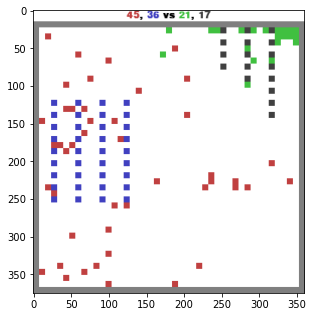

In [145]:
import gym
import gnwrapper
from pettingzoo.magent import combined_arms_v5
import pickle

MAX_TIMESTEPS = 500

# Initialize the Combined Arms environment
env = combined_arms_v5.parallel_env() # Parallel environemnt
env = gnwrapper.LoopAnimation(env) # Start Xvfb

# Instantiate models
redModel = MyModel()
blueModel = MyModel()

# Save (pickle) model
pickle.dump(redModel, open("redModel.pkl", 'wb') )

# Load pickled model
with open("redModel.pkl", 'rb') as pickle_model:
  redModel = pickle.load(pickle_model)

observations = env.reset()

for step in range(MAX_TIMESTEPS):
  actions = {}

  # For each agent, get the next action
  for agent in env.agents:
    model = None
    if "red" in agent:
      model = redModel
    elif "blue" in agent:
      model = blueModel
    
    actions.update({agent: model.predict(env, observations[agent], agent) })

  observations, rewards, dones, infos = env.step(actions)
  
  # print(observations["redmelee_36"][:,:,6]) #7,8 detects black 6 detects green

  env.render() # Render the current frame

# Display the rendered movie
env.display()

# Final Stats
redMelee = 0
redRanged = 0
blueMelee = 0
blueRanged = 0
for agent in env.agents:
  if "redmelee" in agent:
    redMelee += 1
  elif "redranged" in agent:
    redRanged += 1
  elif "bluemele" in agent:
    blueMelee += 1
  elif "blueranged" in agent:
    blueRanged += 1

print("Red Total {}: (Melee {}, Ranged {})".format(redMelee+redRanged,redMelee, redRanged) )
print("Blue Total {}: (Melee {}, Ranged {})".format(blueMelee+blueRanged,blueMelee, blueRanged) )

